In [ ]:
Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:
Number of columns: 23


Date  - The date of observation
Location  -The common name of the location of the weather station
MinTemp  -The minimum temperature in degrees celsius
MaxTemp -The maximum temperature in degrees celsius
Rainfall  -The amount of rainfall recorded for the day in mm
Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
Sunshine  -The number of hours of bright sunshine in the day.
WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
WindDir9am -Direction of the wind at 9am
WindDir3pm -Direction of the wind at 3pm
WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
Humidity9am -Humidity (percent) at 9am
Humidity3pm -Humidity (percent) at 3pm
Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
Cloud9am - Fraction of sky obscured by cloud at 9am. 
Cloud3pm -Fraction of sky obscured by cloud 
Temp9am-Temperature (degrees C) at 9am
Temp3pm -Temperature (degrees C) at 3pm
RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

Based on the problem statement we have two parts to predict:
a)A binary classiffication problem to forecast whether or not it will rain tomorrow.(two possible classes)
b)A regression problem to predict how much rainfall could be there(amount of rainfall is continuous data)


In [147]:
#Import the necessary libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [148]:
#loading the data
df=pd.read_csv(r"C:\Users\bee\Desktop\Data set\Rainfall.csv")

In [149]:
#print first 5 records
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [150]:
#print last 5 records
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [151]:
#checking the shape of the data
#there are 8425 rows and 23 columns
df.shape

(8425, 23)

In [152]:
df.dtypes#Checking the data types of all columns

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [153]:
#Checking information about the dataset
df.info()
#The data contains 16 float data columns and 7 object columns,memory used is above 1.5MB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [154]:
#the datatype of the date is incorrect,this needs to be changed
df['Date'] = pd.to_datetime(df['Date'])

In [155]:
# Create separate columns for month,day and year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day
df['year'] = df['Date'].dt.year

In [156]:
#I will also drop the date column it was  replaced  by two seperate columns namely Day,month and year to get a seperate view when analysing the data
df.drop(['Date'], axis=1, inplace=True)

In [157]:
#check data shape after removing some columns
df.shape

(8425, 25)

In [158]:
#Checking information about the dataset after changes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   object 
 1   MinTemp        8350 non-null   float64
 2   MaxTemp        8365 non-null   float64
 3   Rainfall       8185 non-null   float64
 4   Evaporation    4913 non-null   float64
 5   Sunshine       4431 non-null   float64
 6   WindGustDir    7434 non-null   object 
 7   WindGustSpeed  7434 non-null   float64
 8   WindDir9am     7596 non-null   object 
 9   WindDir3pm     8117 non-null   object 
 10  WindSpeed9am   8349 non-null   float64
 11  WindSpeed3pm   8318 non-null   float64
 12  Humidity9am    8366 non-null   float64
 13  Humidity3pm    8323 non-null   float64
 14  Pressure9am    7116 non-null   float64
 15  Pressure3pm    7113 non-null   float64
 16  Cloud9am       6004 non-null   float64
 17  Cloud3pm       5970 non-null   float64
 18  Temp9am 

In [159]:
#checking columns of dataset
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'month', 'day', 'year'],
      dtype='object')

In [160]:
#Checking Duplicate value in data set
print("Total Duplicate Rows are",df.duplicated().sum())#1663 duplicates

Total Duplicate Rows are 1663


In [161]:
#removing duplicates
df. drop_duplicates(inplace=True)

In [162]:
#Checking if Duplicates have been removed
print("Total Duplicate Rows are",df.duplicated().sum())

Total Duplicate Rows are 0


In [163]:
#Checking unique values of each columns
df.nunique().to_frame("No. of Unique values")#I can clearly see the number of uniques values per each column

,No. of Unique values
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16
WindDir3pm,16


In [164]:
#checking the value of count of each column(this is to get count of frequency of each unique value in column)
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: count, dtype: int64


MinTemp
13.2    58
12.0    57
14.8    53
12.7    53
10.8    52
        ..
26.6     1
28.0     1
26.9     1
1.4      1
26.0     1
Name: count, Length: 285, dtype: int64


MaxTemp
19.0    66
19.8    62
20.8    54
23.8    54
25.0    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: count, Length: 331, dtype: int64


Rainfall
0.0      4334
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: count, Length: 250, dtype: int64


Evaporation
4.0      141
3.0      125
2.2      118
2.4      116
2.6      116
        ... 
145.0      1
33.8       1
59.2       1
20.8       1
0.7        1
Name: count,

In [ ]:
Location:PerthAirport is the most common location.
MinTemp:13.2 degrees celsius is the most frequent maximum temperature
MaxTemp:19.0 degrees celsius is the most frequent maximum temperature
Rainfall:there is no rainfall on most occurences therefore the most frequent reading is 0
Evaporation:the most frequent one is 4mm
Sunshine:there is no sunshine most of the time
WindGustDir:Easterly winds are the most common 
WindGustSpeed:39.0km/hr is the most common windspeed
WindDir9am:the most frequent wind direction at 9am is North
WindDir3pm:the most frequent wind direction at 3pm is South easterly
WindSpeed9am:the most frequent wind speed at 9am is 0.0
WindSpeed3pm:the most frequent wind speed at 9am is 9.0
Humidity9am:the most frequent humidity at 9am is 68%
Humidity3pm:the most frequent humidity at 3pm is 46%
Pressure9am:the most common atmospheric pressure at 9am is 1019.2 hpa
Pressure3pm:the most common atmospheric pressure at 3pm is 1017.8 hpa
Cloud9am:7% cloud cover is the most at 9am
Cloud3pm:7% cloud cover is the most at 9pm
Temp9am:the most common temperature at 9am is 14.8 degrees C
Temp3pm:the most common temperature at 3pm is 19.2 degrees C
RainToday:No is the most frequent outcome for possibility of rain on the same day
RainTomorrow:No is the most frequent outcome for possibility of rain on the nextday,there is an imbalance of data which will be dealt with
Year:2011
Month:the 6th is the most frequent one in the dataset
Day:they range from 1 up to 31

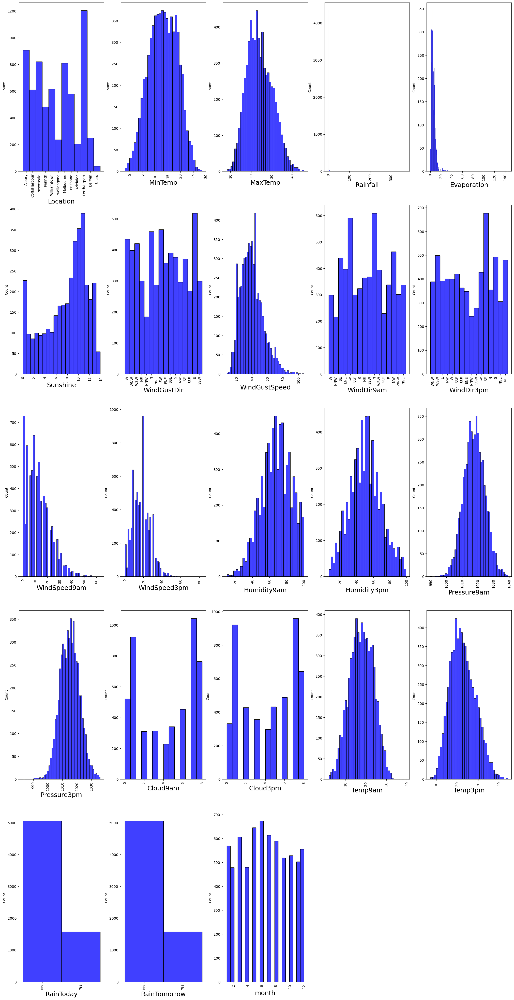

In [165]:
#Getting a graphical view of value counts for each column
plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in df:
    if plotnumber <=23:
        ax = plt.subplot(5,5,plotnumber)
        sns.histplot(df[column], color = 'blue')
        plt.xlabel(column,fontsize=18)
        plt.xticks(rotation=90, fontsize=10)
        
    plotnumber +=1
plt.show()

In [166]:
#Checking for null or missing values in the dataset
df.isnull().sum()

Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
month               0
day                 0
year                0
dtype: int64

<Axes: >

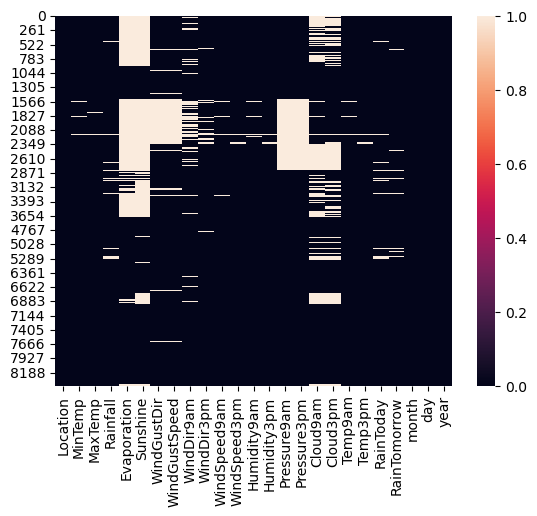

In [167]:
#visualize null using a heatmap
sns.heatmap(df.isnull())#visual confirmation of all null values 

In [169]:
#dropping columns with too many missing values,filling them will have an impact our model accuracy
df.drop(['Evaporation','Sunshine','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm'], axis=1, inplace=True)

In [170]:
#filling null values for float data type with median
# filling null values with median in numerical columns
df[['WindSpeed9am','WindSpeed3pm','MinTemp','MaxTemp','Rainfall','WindGustSpeed','Humidity9am','Humidity3pm','Temp9am','Temp3pm']] = df[['WindSpeed9am','WindSpeed3pm','MinTemp','MaxTemp','Rainfall','WindGustSpeed','Humidity9am','Humidity3pm','Temp9am','Temp3pm']].fillna(df[['WindSpeed9am','WindSpeed3pm','MinTemp','MaxTemp','Rainfall','WindGustSpeed','Humidity9am','Humidity3pm','Temp9am','Temp3pm']].median())

In [171]:
#filling null values for object data type with ffill method
df["WindGustDir"].fillna( method ='ffill', inplace = True)
df["WindDir9am"].fillna( method ='ffill', inplace = True)
df["WindDir3pm"].fillna( method ='ffill', inplace = True)
df["RainToday"].fillna( method ='ffill', inplace = True)
df["RainTomorrow"].fillna( method ='ffill', inplace = True)

In [172]:
#Checking for null or missing values in the dataset again
#all null values have been dealt with
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
month            0
day              0
year             0
dtype: int64

<Axes: >

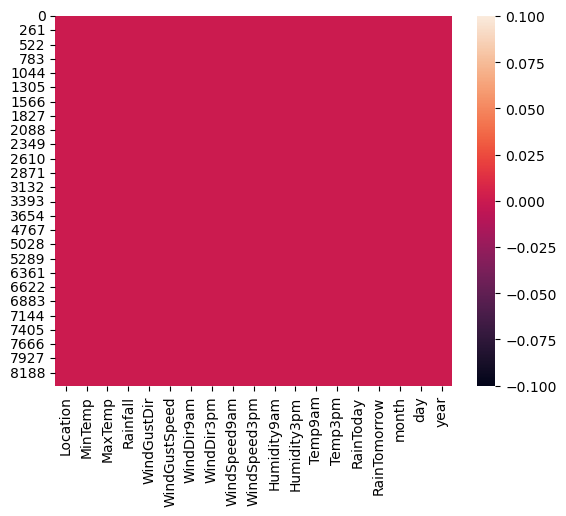

In [173]:
#visualize null using a heatmap
sns.heatmap(df.isnull())#confirmation of no null values 

In [174]:
#Statistical summary of numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,6762.0,13.110086,5.540674,-2.0,9.0,13.2,17.4,28.5
MaxTemp,6762.0,24.093301,6.130367,8.2,19.6,23.5,28.4,45.5
Rainfall,6762.0,2.723410,10.490138,0.0,0.0,0.0,0.8,371.0
WindGustSpeed,6762.0,38.702159,13.393977,7.0,30.0,37.0,46.0,107.0
WindSpeed9am,6762.0,12.765602,9.789075,0.0,6.0,11.0,19.0,63.0
WindSpeed3pm,6762.0,17.562703,9.548883,0.0,11.0,17.0,24.0,83.0
Humidity9am,6762.0,67.510500,17.182756,10.0,56.0,68.0,80.0,100.0
Humidity3pm,6762.0,50.460515,18.498424,6.0,38.0,50.0,62.0,99.0
Temp9am,6762.0,17.895830,5.722418,1.9,13.9,18.0,22.2,39.4
Temp3pm,6762.0,22.700281,5.972262,7.3,18.4,22.1,26.8,44.1


In [ ]:
Interpretation of the Statistical summary of dataset

General view
#from the statistical description above the count of all columns are similar therefore no missing data values(6762)
#where the mean value of a column is greater than the median(second percentile)the data is skewed to the right.
#where the mean value of a column is less than the median(second percentile)the data is skewed to the left
#In all columns there are huge differences between the third percentile and max values which signify the existance of outliers in the data. 
#Standard deviation represent the measure of variabilty per column,the bigger the figure the greater the variability


Column specific statistical view

MinTemp- the average minimum temprature is 13.11,with a minimum of -2 and maximum of 28.5 degrees celscius

MaxTemp-the average maximum temprature is 24.09,with a minimum of 8.2 and maximum of 45.5 degrees celscius

Rainfall-the average rainfall is 2.72,with a minimum o of 0 and maximum of 371mm

WindGustSpeed-the average strongest wind is 38.70,with a minimum of 7 and maximum of 107km/hr

WindSpeed9am-the average windspeed at 9am is 12.76.11,with a minimum of 0 and maximum of 63km/hr

WindSpeed3pm-the average windspeed ar 3pm 117.56,with a minimum of 0 and maximum of 83km/hr

Humidity9am-the average humidity at 9am is 67.5,with a minimum of 10 and maximum of 100%

Humidity3pm-the average humidity at 3pm is 50.46,with a minimum of 6 and maximum of 99%

Temp9am-the average temperature at 3pm is 1.9,with a minimum of 0 and maximum of 39.4

Temp3pm-the average temperature at 9pm is 7.3,with a minimum of 0 and maximum of 41.1

month-the average month is the 6th month with a minimum of 1 to 12 months in a yer

day-the average number of days is 15,ranging  from1 to 31

year-the average year is 2012 from year 2008-2017

In [175]:
#Summary of columns with categorical data
df.describe(include='object')

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,6762,6762,6762,6762,6762,6762
unique,12,16,16,16,2,2
top,PerthAirport,NNE,SW,SE,No,No
freq,1204,1112,718,771,5151,5151


In [176]:
#Split between Categorical and Numerical columns

categorical = ['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']
numerical = ['MinTemp','MaxTemp','Rainfall','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Temp9am','Temp3pm','month','day','year']

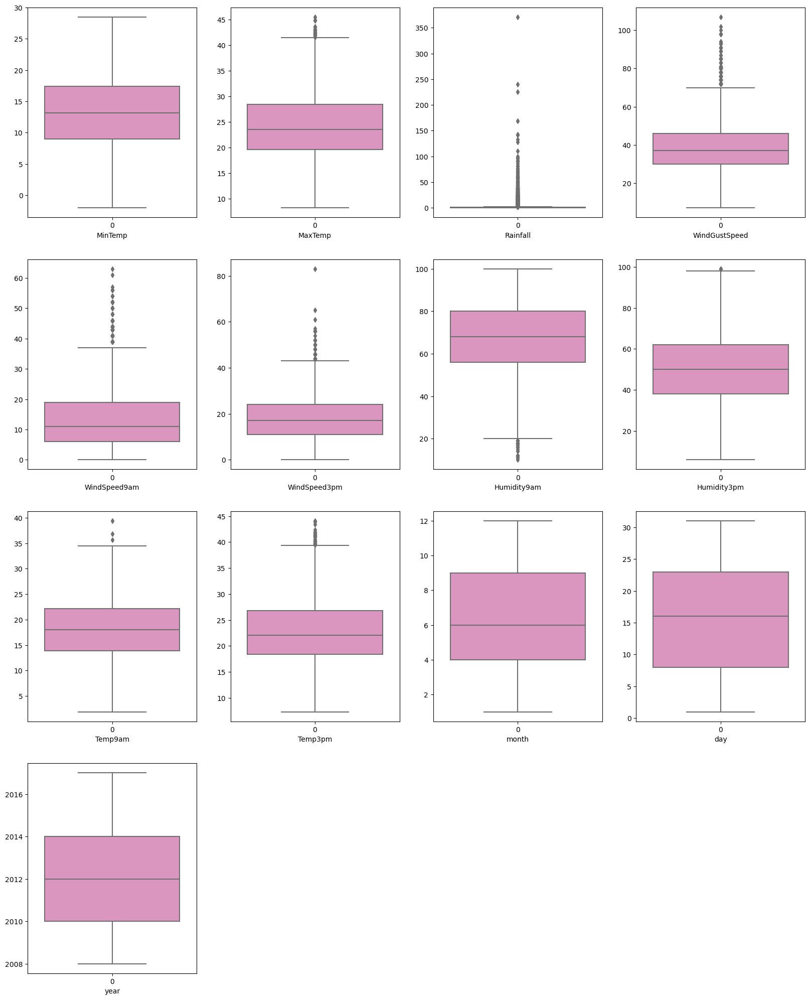

In [177]:
#Let's check data distribution and outliers using boxplot
#please note that this is for numerical columns only and its evident that there are outliers in all columns as mention in the statistial summary
#I only considered only numerical columns
#Outliers will be dealt with later
plt.figure(figsize=(20,25))
p=1
for column in numerical:
    if p<=15:
        plt.subplot(4,4,p)
        sns.boxplot(df[column], palette ="Set2_r")
        plt.xlabel(column)
        
    p+=1
    
plt.show()

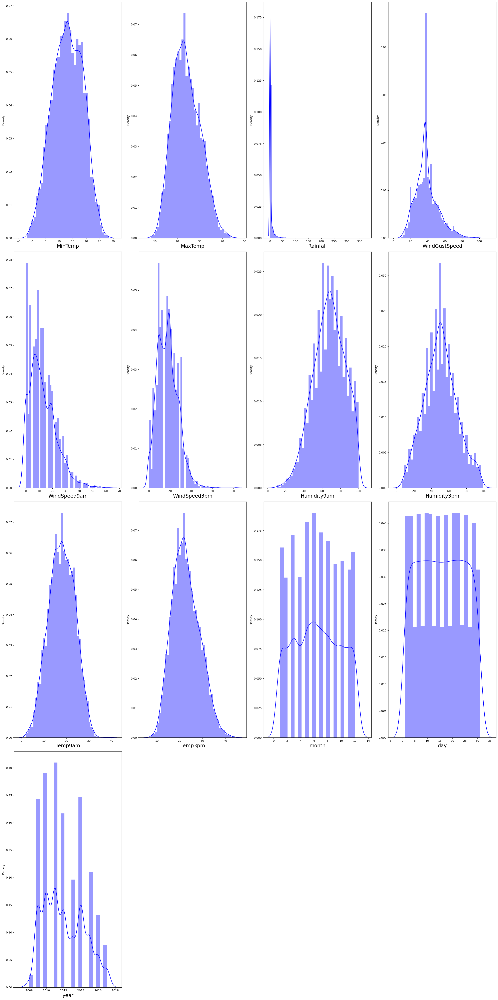

In [178]:
#Checking the distribution of data using distribution plot
#This is for numerical columns only and  excluding day,month,year ,region and type hence out of the 14 columns I considered only 9 in visualization below
#I see a normal distribution  signified by the bell shape of the graph with skeweness in the data
plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in numerical:
    if plotnumber <=15:
        ax = plt.subplot(4,4,plotnumber)
        sns.distplot(df[column], color = 'blue')
        plt.xlabel(column,fontsize=18)
        
    plotnumber +=1
plt.tight_layout()

In [ ]:
Data Visualizaton

In [ ]:
#Univariate analysis for numerical columns

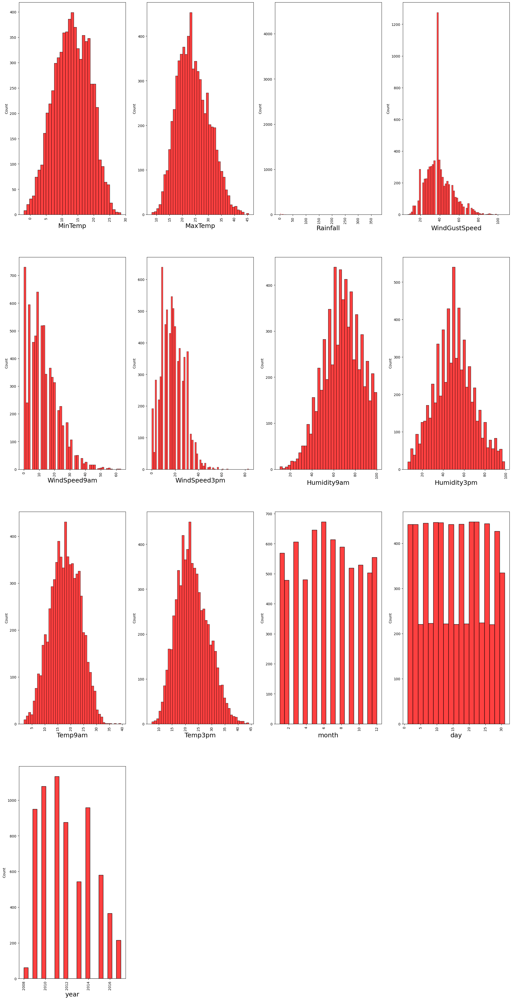

In [179]:
plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in numerical:
    if plotnumber <=15:
        ax = plt.subplot(4,4,plotnumber)
        sns.histplot(df[column], color = 'red')
        plt.xlabel(column,fontsize=18)
        plt.xticks(rotation=90, fontsize=10)
        
    plotnumber +=1
plt.show()

In [ ]:
#Univariate Analysis-Categorical columns

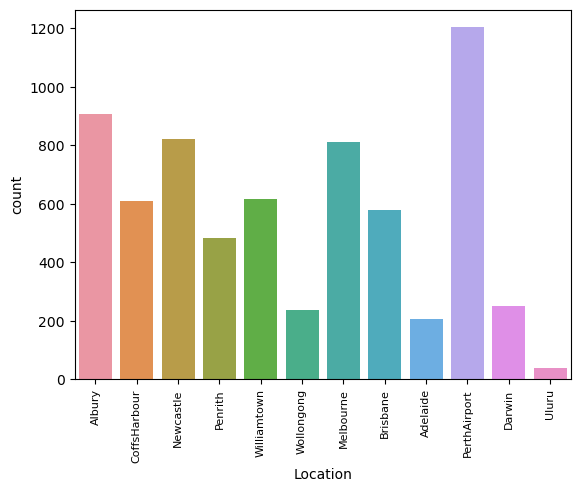

In [180]:
##Univariate analysis for catergorical columns
ax=sns.countplot(x='Location',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

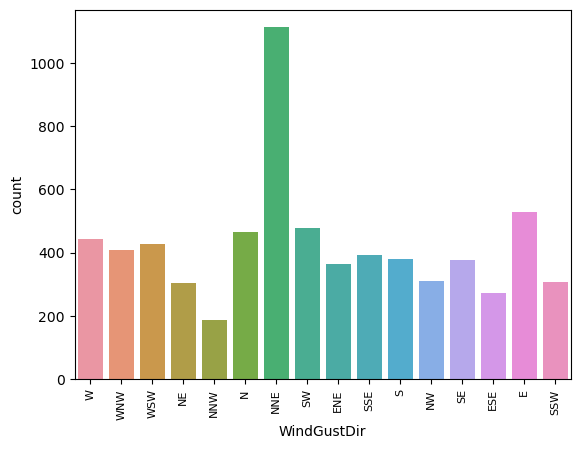

In [181]:
ax=sns.countplot(x='WindGustDir',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

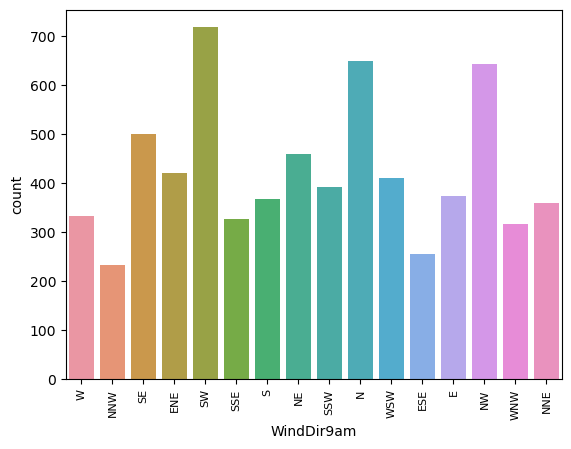

In [182]:
ax=sns.countplot(x='WindDir9am',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

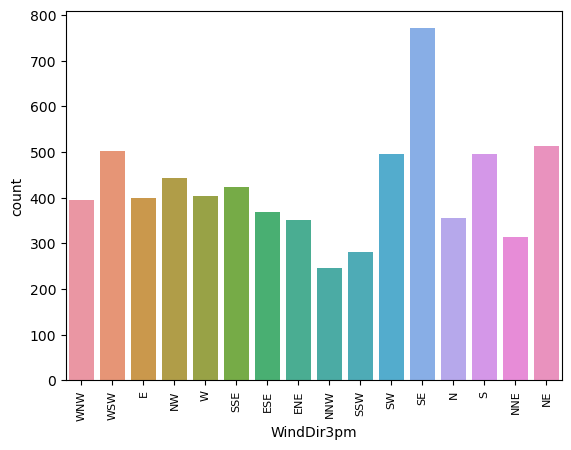

In [183]:
ax=sns.countplot(x='WindDir3pm',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

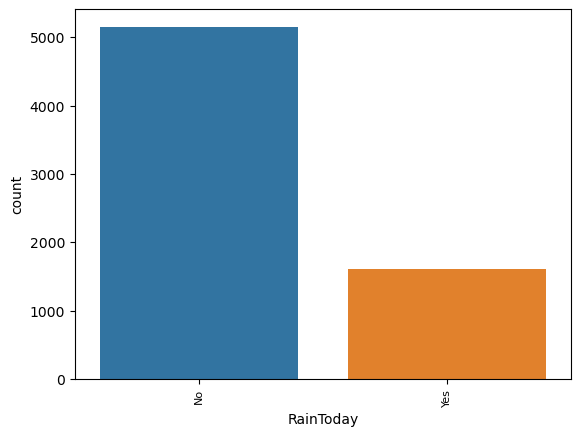

In [184]:
ax=sns.countplot(x='RainToday',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

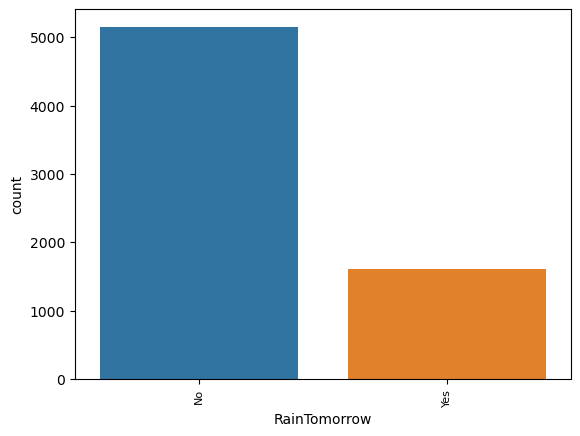

In [185]:
ax=sns.countplot(x='RainTomorrow',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

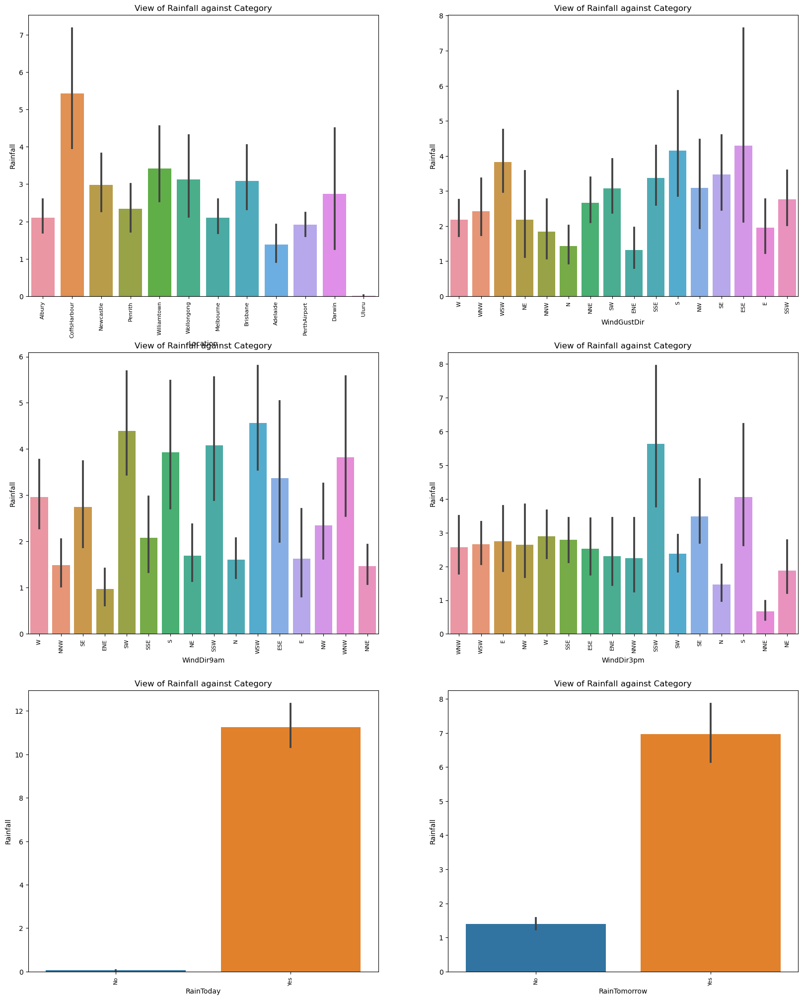

In [186]:
#Bivariate analysis of target variable versus categorical columns

plt.figure(figsize = (20,25), facecolor = 'white')
p=1

for column in categorical:
    if p<=6:
        plt.subplot(3,2,p)
        sns.barplot(x=df[column],y='Rainfall',data=df)
    plt.title("View of Rainfall against Category")
    plt.xticks(rotation=90, fontsize=8)
      
    p+= 1
plt.show()

In [ ]:
In Bivariate analysis of target variable versus categorical columns it is evident that

#Coffs Harbour is the place with the most rainfall.

#ESE are the strongest  winds   associated with the most rain.

#WSE is the wind direction associated wih the most rainfall at 9am

#SSW is the wind direction associated wih the most rainfall at 3pm

#there is a great expectation of rain both today and tomorrow

In [ ]:
Bivariate analysis of the second target variable (RainTomorrow) with categorical columns

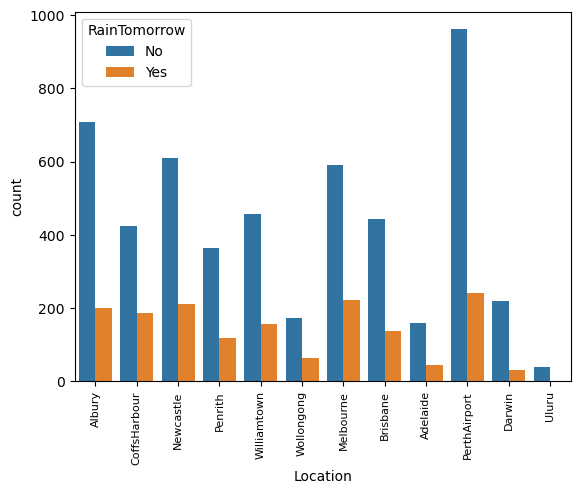

In [187]:
#View Location V RainTomorrow
ax=sns.countplot(x='Location',data=df,hue='RainTomorrow')
plt.xticks(rotation=90, fontsize=8)
plt.show()
#Perth airport has both the most and less possibility of rain tomorrow

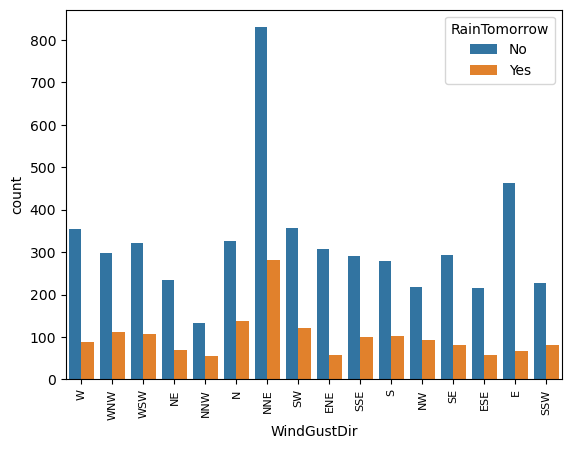

In [188]:
#View WindGustDir V RainTomorrow
ax=sns.countplot(x='WindGustDir',data=df,hue='RainTomorrow')
plt.xticks(rotation=90, fontsize=8)
plt.show()
#NNE strong winds are associated with most and less possibility of Rain tomorrow

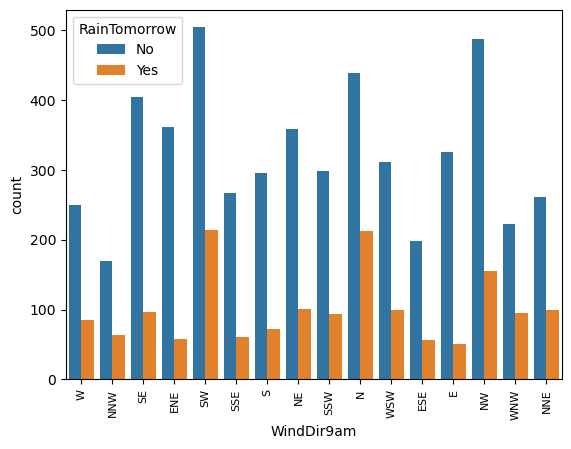

In [189]:
#View WindDir9am V RainTomorrow
ax=sns.countplot(x='WindDir9am',data=df,hue='RainTomorrow')
plt.xticks(rotation=90, fontsize=8)
plt.show()
#SW wind direction is associated with most and less possibility of Rain tomorrow at 9am

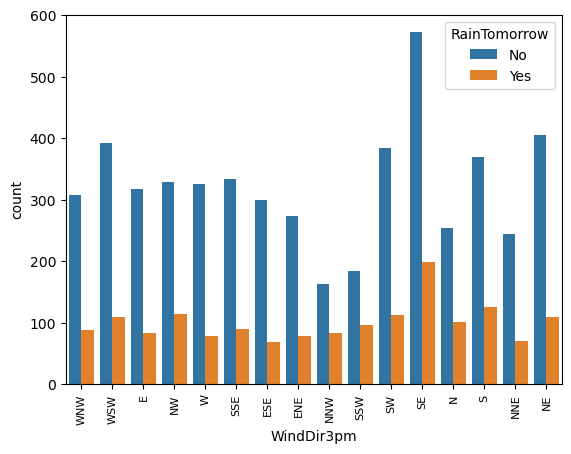

In [190]:
#View WindDir3pm V RainTomorrow
ax=sns.countplot(x='WindDir3pm',data=df,hue='RainTomorrow')
plt.xticks(rotation=90, fontsize=8)
plt.show()
#SE wind direction is associated with most and less possibility of Rain tomorrow at 3pm

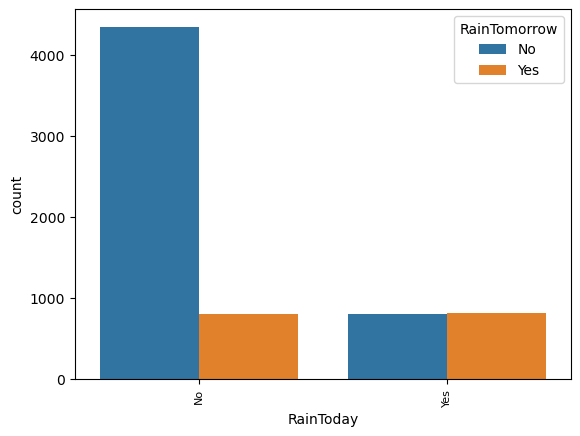

In [191]:
#View RainToday V RainTomorrow
ax=sns.countplot(x='RainToday',data=df,hue='RainTomorrow')
plt.xticks(rotation=90, fontsize=8)
plt.show()
#there is a less chance of rain tommorrow 

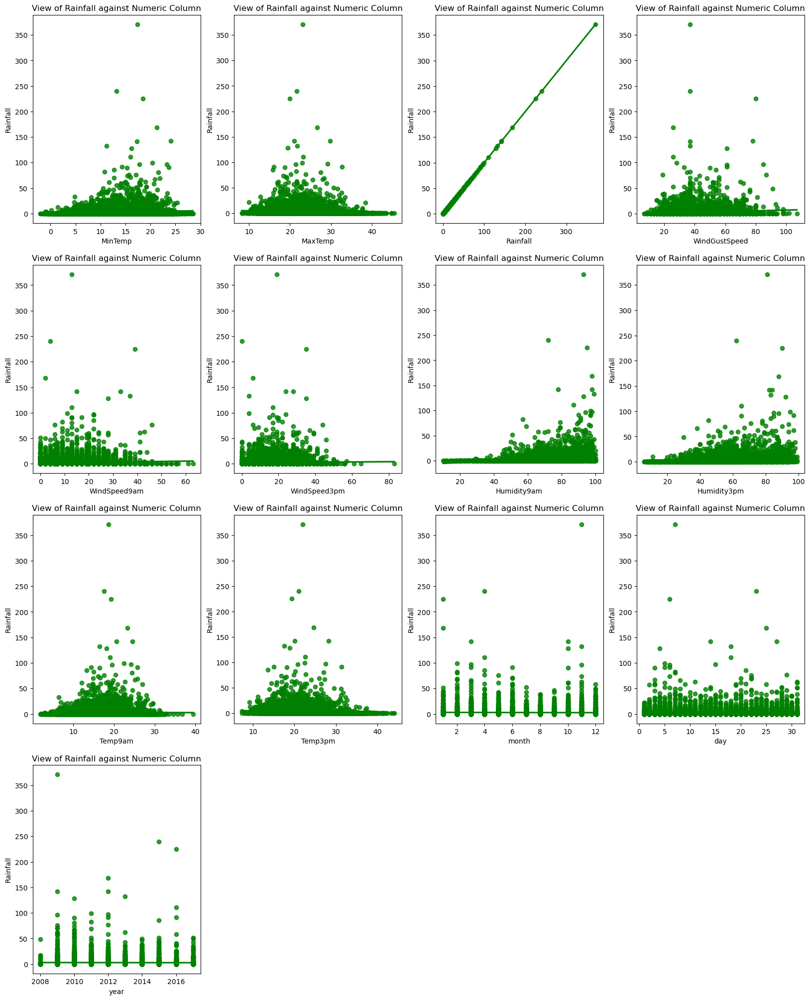

In [192]:
#Bivariate analysis of Rainfall versus numerical columns

plt.figure(figsize = (20,25), facecolor = 'white')
p=1

for column in numerical:
    if p<=15:
        plt.subplot(4,4,p)
        sns.regplot(x=df[column],y='Rainfall',data=df,color='green')
        plt.title("View of Rainfall against Numeric Column")
      
    p+= 1
plt.show()

#there is a weak positive relationship between MinTemp and Rainfall
#MaxTemp has its highest a positive relationship with rainfall around the mid 20 degrees celsius
#Humidity has a weak positive relationship with rainfall 
#high windspeeds are associated with no rainfall

In [ ]:
Bivariate analysis of numerical columns with a categorical target variable

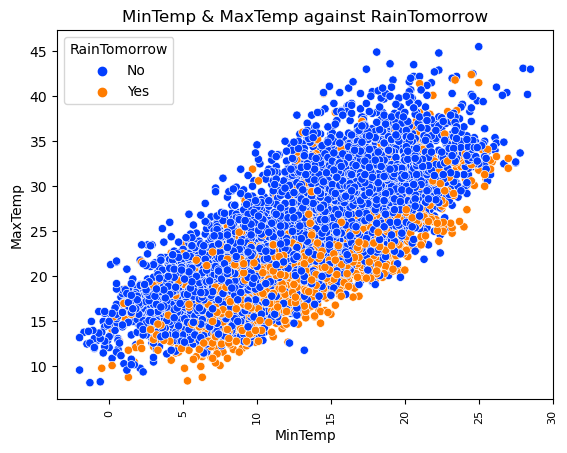

In [193]:
ax=sns.scatterplot(x='MinTemp',y='MaxTemp',hue='RainTomorrow',data=df,palette='bright')
plt.xticks(rotation=90, fontsize=8)
plt.title("MinTemp & MaxTemp against RainTomorrow")
plt.show()

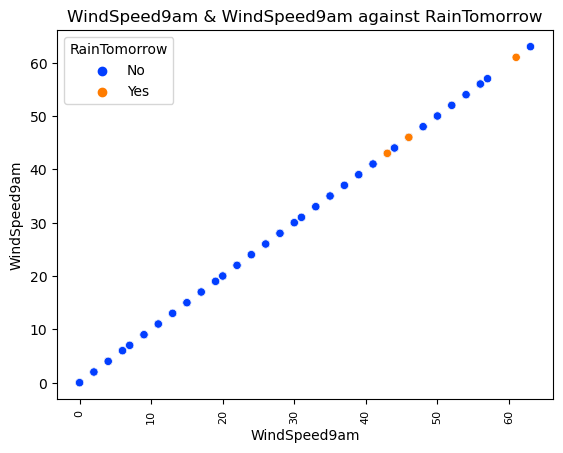

In [195]:
ax=sns.scatterplot(x='WindSpeed9am',y='WindSpeed9am',hue='RainTomorrow',data=df,palette='bright')
plt.xticks(rotation=90, fontsize=8)
plt.title("WindSpeed9am & WindSpeed9am against RainTomorrow")
plt.show()

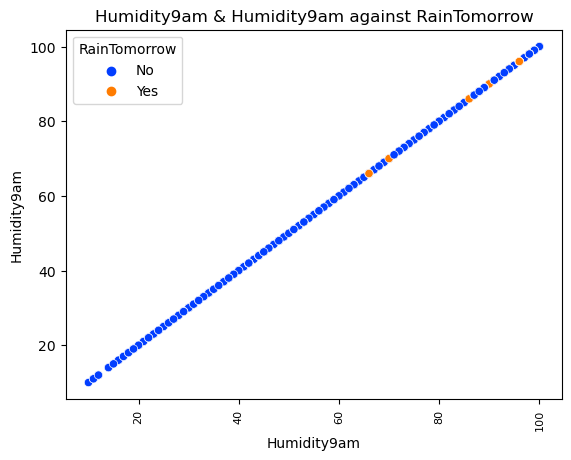

In [196]:
ax=sns.scatterplot(x='Humidity9am',y='Humidity9am',hue='RainTomorrow',data=df,palette='bright')
plt.xticks(rotation=90, fontsize=8)
plt.title("Humidity9am & Humidity9am against RainTomorrow")
plt.show()

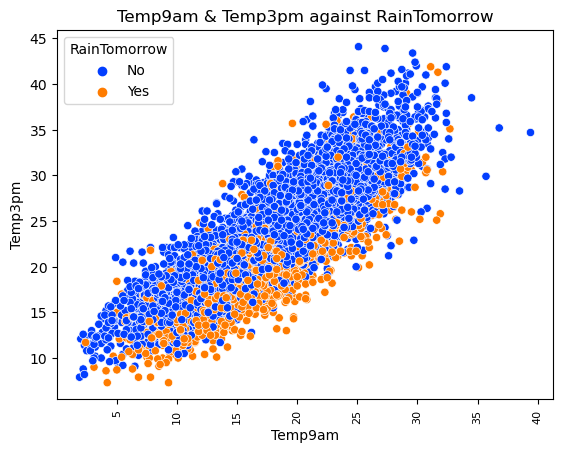

In [198]:
ax=sns.scatterplot(x='Temp9am',y='Temp3pm',hue='RainTomorrow',data=df,palette='bright')
plt.xticks(rotation=90, fontsize=8)
plt.title("Temp9am & Temp3pm against RainTomorrow")
plt.show()

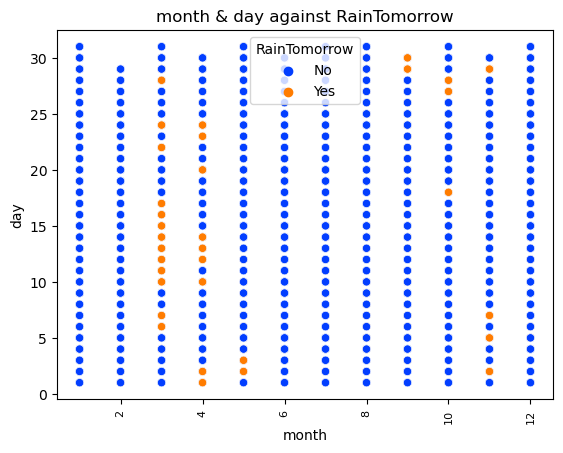

In [199]:
ax=sns.scatterplot(x='month',y='day',hue='RainTomorrow',data=df,palette='bright')
plt.xticks(rotation=90, fontsize=8)
plt.title("month & day against RainTomorrow")
plt.show()

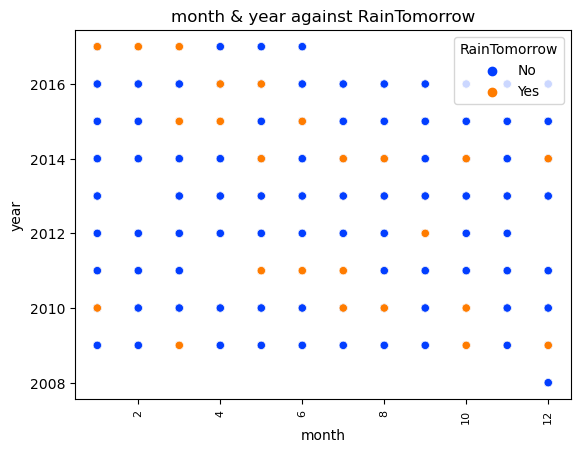

In [200]:
ax=sns.scatterplot(x='month',y='year',hue='RainTomorrow',data=df,palette='bright')
plt.xticks(rotation=90, fontsize=8)
plt.title("month & year against RainTomorrow")
plt.show()

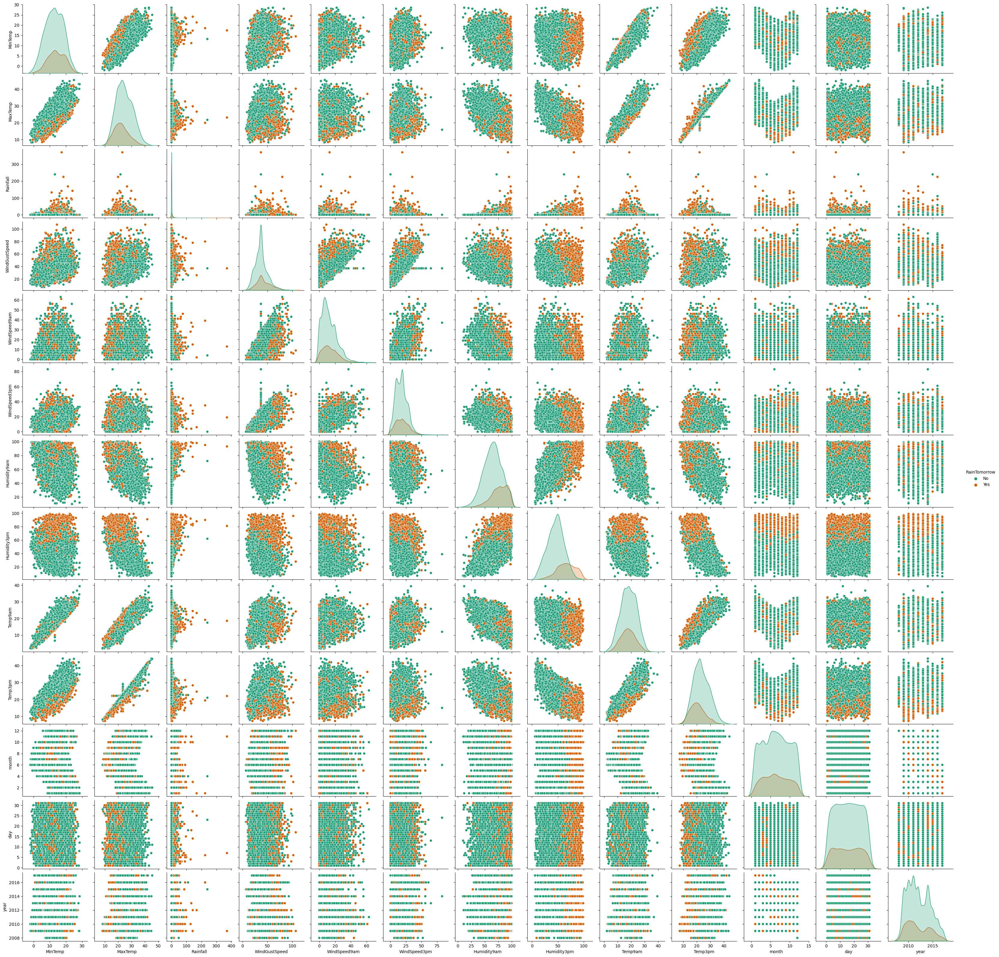

In [201]:
#Multivariate analysis
sns.pairplot(data =df,hue="RainTomorrow",palette="Dark2")
plt.show()

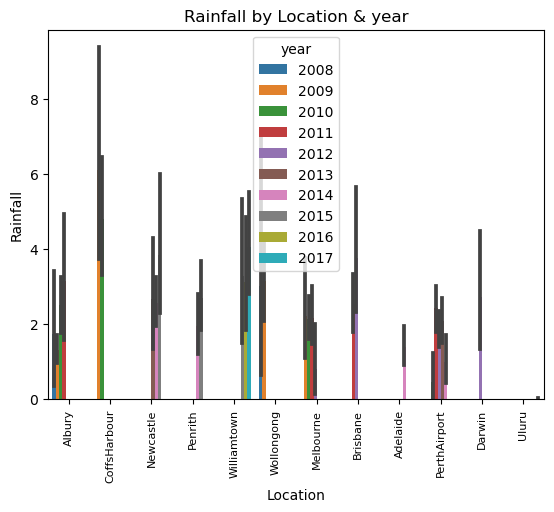

In [202]:
plt.title("Rainfall by Location & year")
sns.barplot(x='Location',y='Rainfall',hue='year',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

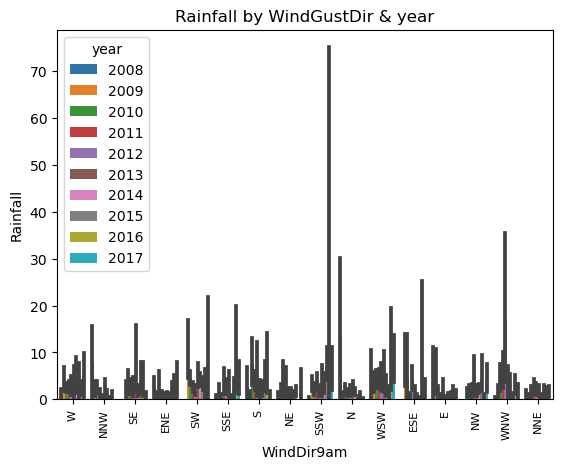

In [203]:
plt.title("Rainfall by WindGustDir & year")
sns.barplot(x='WindDir9am',y='Rainfall',hue='year',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

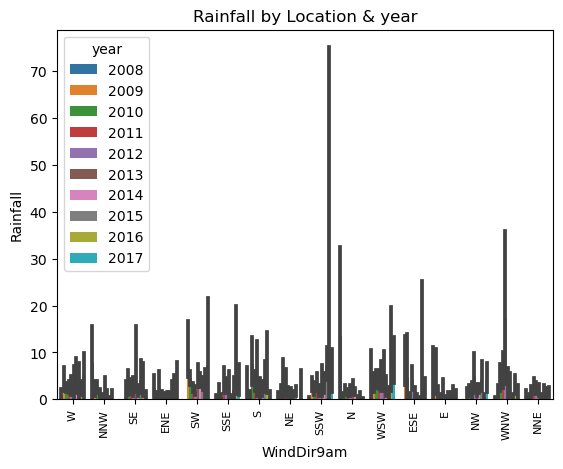

In [204]:
plt.title("Rainfall by Location & year")
sns.barplot(x='WindDir9am',y='Rainfall',hue='year',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

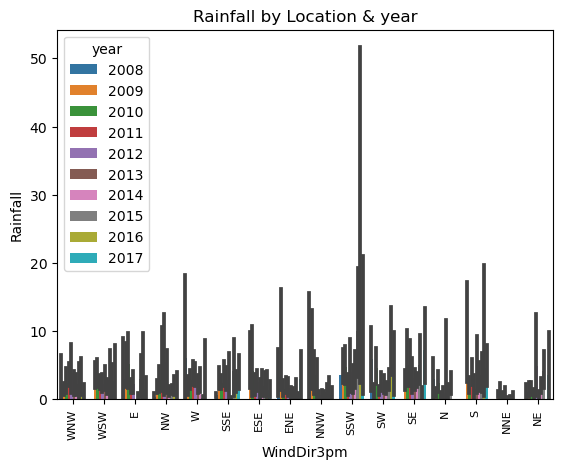

In [205]:
plt.title("Rainfall by Location & year")
sns.barplot(x='WindDir3pm',y='Rainfall',hue='year',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

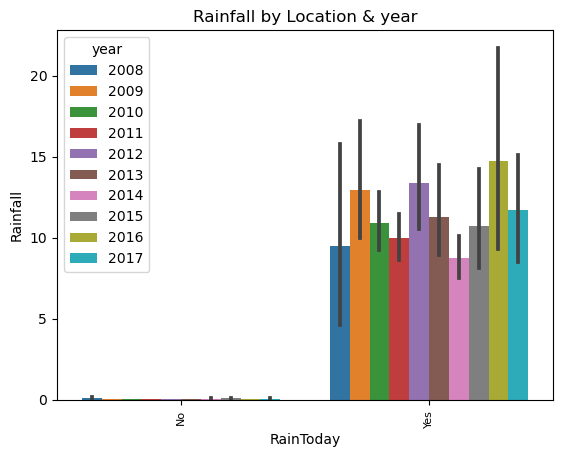

In [206]:
plt.title("Rainfall by Location & year")
sns.barplot(x='RainToday',y='Rainfall',hue='year',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

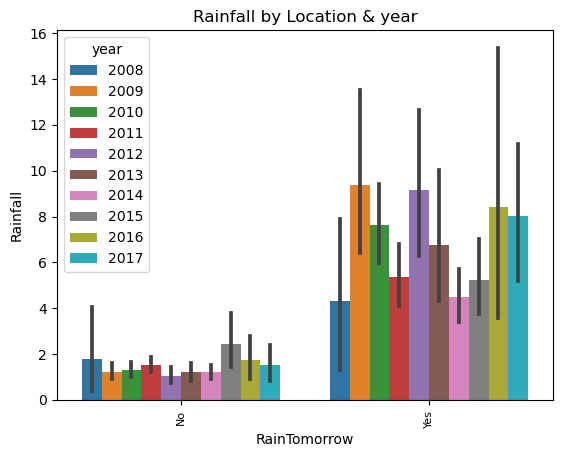

In [207]:
plt.title("Rainfall by Location & year")
sns.barplot(x='RainTomorrow',y='Rainfall',hue='year',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

In [208]:
#Transforming categorical into numerical data
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

df['Location'] = le.fit_transform(df['Location'])

df['WindGustDir'] = le.fit_transform(df['WindGustDir'])

df['WindDir9am'] = le.fit_transform(df['WindDir9am'])

df['WindDir3pm'] = le.fit_transform(df['WindDir3pm'])

df['RainToday'] = le.fit_transform(df['RainToday'])

df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])

df.head(10)

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,month,day,year
0,1,13.4,22.9,0.6,13,44.0,13,14,20.0,24.0,71.0,22.0,16.9,21.8,0,0,12,1,2008
1,1,7.4,25.1,0.0,14,44.0,6,15,4.0,22.0,44.0,25.0,17.2,24.3,0,0,12,2,2008
2,1,12.9,25.7,0.0,15,46.0,13,15,19.0,26.0,38.0,30.0,21.0,23.2,0,0,12,3,2008
3,1,9.2,28.0,0.0,4,24.0,9,0,11.0,9.0,45.0,16.0,18.1,26.5,0,0,12,4,2008
4,1,17.5,32.3,1.0,13,41.0,1,7,7.0,20.0,82.0,33.0,17.8,29.7,0,0,12,5,2008
5,1,14.6,29.7,0.2,14,56.0,13,13,19.0,24.0,55.0,23.0,20.6,28.9,0,0,12,6,2008
6,1,14.3,25.0,0.0,13,50.0,12,13,20.0,24.0,49.0,19.0,18.1,24.6,0,0,12,7,2008
7,1,7.7,26.7,0.0,13,35.0,10,13,6.0,17.0,48.0,19.0,16.3,25.5,0,0,12,8,2008
8,1,9.7,31.9,0.0,6,80.0,9,7,7.0,28.0,42.0,9.0,18.3,30.2,0,1,12,9,2008
9,1,13.1,30.1,1.4,13,28.0,8,10,15.0,11.0,58.0,27.0,20.1,28.2,1,0,12,10,2008


In [209]:
#Tabular view of Correlation
cor=df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,month,day,year
Location,1.000000,0.090455,0.070761,-0.004972,-0.057569,0.254955,-0.093277,-0.002495,0.239883,0.229565,-0.033586,-0.001569,0.098576,0.066010,-0.002186,-0.002410,-0.067376,-0.000710,0.503047
MinTemp,0.090455,1.000000,0.728059,0.090971,-0.161604,0.242823,-0.071121,-0.145029,0.168996,0.188485,-0.154218,0.067847,0.891417,0.696861,0.074529,0.097411,-0.237204,0.014356,0.032974
MaxTemp,0.070761,0.728059,1.000000,-0.087604,-0.229260,0.166300,-0.235686,-0.162981,0.056452,0.115951,-0.425100,-0.430599,0.866654,0.974994,-0.228194,-0.164145,-0.171616,0.016108,0.081092
Rainfall,-0.004972,0.090971,-0.087604,1.000000,0.033969,0.086519,0.090467,0.030132,0.050206,0.020421,0.227943,0.243005,-0.004365,-0.091795,0.454402,0.226119,-0.015187,-0.007989,-0.008516
WindGustDir,-0.057569,-0.161604,-0.229260,0.033969,1.000000,0.020081,0.361401,0.517587,-0.016962,0.088407,0.054807,0.061057,-0.182161,-0.242645,0.121302,0.045256,0.046690,0.004979,-0.076305
WindGustSpeed,0.254955,0.242823,0.166300,0.086519,0.020081,1.000000,-0.124727,0.078691,0.603379,0.628393,-0.274375,-0.100244,0.222317,0.130483,0.087085,0.185036,0.048189,-0.002539,-0.043982
WindDir9am,-0.093277,-0.071121,-0.235686,0.090467,0.361401,-0.124727,1.000000,0.225790,-0.080602,-0.046806,0.106837,0.172588,-0.132235,-0.241598,0.162443,0.045552,0.012138,-0.009008,-0.002611
WindDir3pm,-0.002495,-0.145029,-0.162981,0.030132,0.517587,0.078691,0.225790,1.000000,0.014713,0.096806,-0.010524,-0.016631,-0.150248,-0.173629,0.092028,0.003024,0.041215,-0.001575,0.008478
WindSpeed9am,0.239883,0.168996,0.056452,0.050206,-0.016962,0.603379,-0.080602,0.014713,1.000000,0.551531,-0.373081,-0.121519,0.151807,0.042181,0.035628,0.060241,0.029416,-0.004497,-0.104931
WindSpeed3pm,0.229565,0.188485,0.115951,0.020421,0.088407,0.628393,-0.046806,0.096806,0.551531,1.000000,-0.259909,-0.100619,0.208065,0.092965,0.016560,0.044555,0.059952,-0.011336,-0.077537


<Axes: >

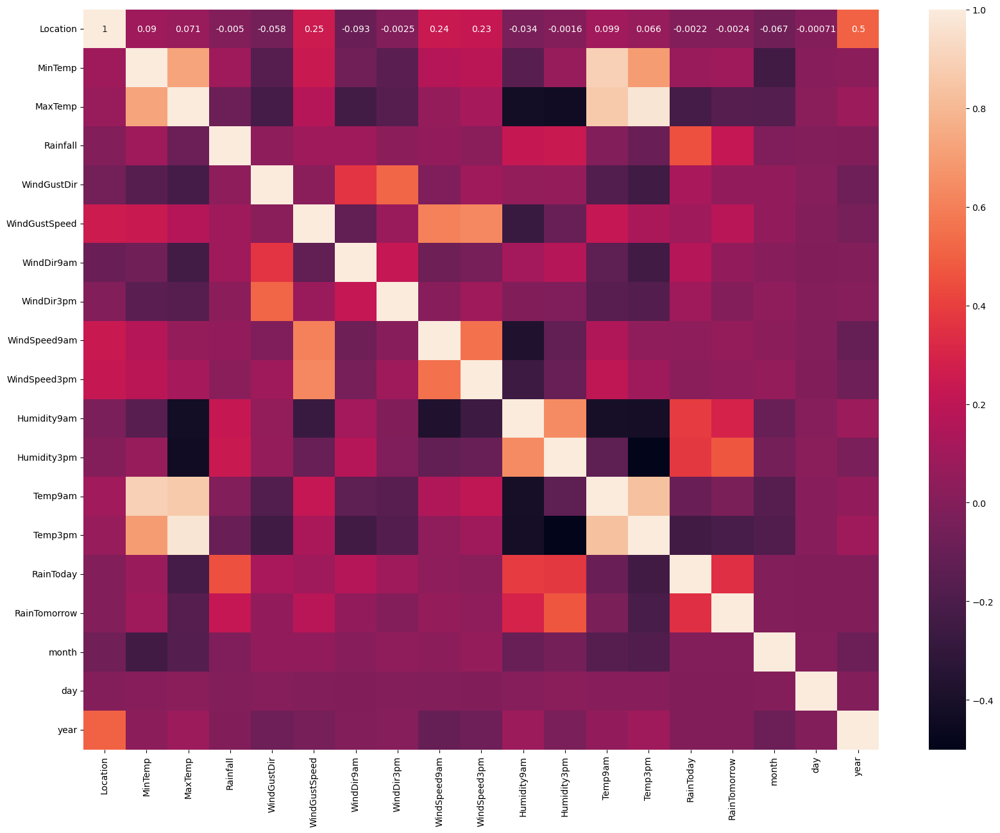

In [210]:
#Visualizing the correlation matrix by plotting heatmap.
f, ax = plt.subplots(figsize=(20, 15))
corr = df.corr()
sns.heatmap(df.corr(),annot=True)

In [ ]:
#the columns have  a mixture of both negative and weak positive correlation with each other
#The table  above demonstrate  multicollinearity which will be dealt with in Standard Scaling and VIF tool

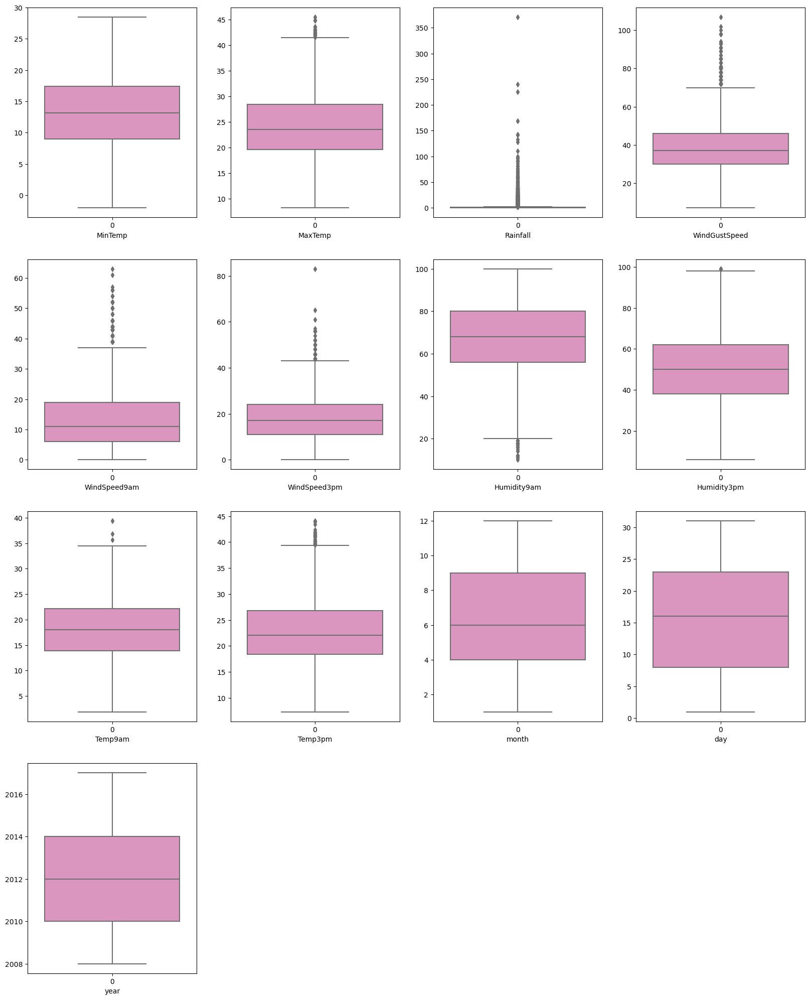

In [211]:
#viewing outliers and removing with them
plt.figure(figsize=(20,25))
p=1
for column in numerical:
    if p<=15:
        plt.subplot(4,4,p)
        sns.boxplot(df[column], palette ="Set2_r")
        plt.xlabel(column)
        
    p+=1
    
plt.show()

In [212]:
#Remove outliers using zscore method
from scipy.stats import zscore
out_features=df[['MinTemp','MaxTemp','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Temp9am','Temp3pm','month','day','year']]
z=np.abs(zscore(out_features))
z

,MinTemp,MaxTemp,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Temp9am,Temp3pm,month,day,year
0,0.052329,0.194668,0.395568,0.739082,0.674191,0.203097,1.538651,0.174035,0.150755,1.639768,1.675969,1.761148
1,1.030652,0.164227,0.395568,0.895514,0.464727,1.368362,1.376463,0.121606,0.267878,1.639768,1.562245,1.761148
2,0.037920,0.262108,0.544900,0.636920,0.883655,1.717576,1.106150,0.542498,0.083680,1.639768,1.448521,1.761148
3,0.705758,0.637317,1.097751,0.180378,0.896789,1.310160,1.863027,0.035682,0.636275,1.639768,1.334798,1.761148
4,0.792365,1.338795,0.171570,0.589027,0.255263,0.843321,0.943962,0.016748,1.172125,1.639768,1.221074,1.761148
...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.860937,0.113101,0.575089,0.023947,0.687325,0.960947,1.430526,1.362432,0.050283,0.136841,0.598504,2.150387
8421,1.716540,0.196854,1.247082,0.023947,0.896789,0.669936,1.592714,1.222621,0.301369,0.136841,0.712227,2.150387
8422,1.391646,0.457869,0.127093,0.384702,0.896789,0.844543,1.430526,0.942998,0.569294,0.136841,0.825951,2.150387
8423,0.958453,0.474183,0.799087,0.023947,1.106253,0.960947,1.430526,0.488611,0.552548,0.136841,0.939675,2.150387


In [213]:
#removing the data above zscore and creating new dataframe
df1=df[(z<3).all(axis=1)]
df1.shape

(6593, 19)

In [214]:
#shape of old and new dataframe
print("Original Data Frame-",df.shape[0])
print("New Data Frame-",df1.shape[0])

Original Data Frame- 6762
New Data Frame- 6593


In [215]:
print("Data Loss Percentage-",((df.shape[0]-df1.shape[0])/df.shape[0])*100)
#there is a 5.66% data loss when using zscore to remove outliers

Data Loss Percentage- 2.4992605737947353


In [268]:
df=df1.copy()
#I will make a copy of the dataframe  because I will need it for the second  target variable as per problem statement

In [217]:
#checking shape of the data
df.shape


(6593, 19)

In [218]:
#Checking for Skewness
df.skew()
#Skeweness is acceptable only within the range of -0.5 and 0.5.
#the columns Rainfall,Evaporation,Sunshine,RainToday and RainTomorrow fall short of that criteria

Location          0.005212
MinTemp          -0.088539
MaxTemp           0.276783
Rainfall         13.863963
WindGustDir       0.062413
WindGustSpeed     0.549549
WindDir9am       -0.042006
WindDir3pm       -0.111599
WindSpeed9am      0.677522
WindSpeed3pm      0.349783
Humidity9am      -0.239238
Humidity3pm       0.162248
Temp9am          -0.071732
Temp3pm           0.300378
RainToday         1.225962
RainTomorrow      1.247658
month             0.030676
day               0.004454
year              0.348890
dtype: float64

In [219]:
#Removing skeweness  using the cuberoot method
df.skew()

df['Rainfall']=np.cbrt(df['Rainfall'])

In [220]:
#check skeweness again
df.skew()
#skeweness is still not within the desired threshold even though it has reduced

Location         0.005212
MinTemp         -0.088539
MaxTemp          0.276783
Rainfall         1.761607
WindGustDir      0.062413
WindGustSpeed    0.549549
WindDir9am      -0.042006
WindDir3pm      -0.111599
WindSpeed9am     0.677522
WindSpeed3pm     0.349783
Humidity9am     -0.239238
Humidity3pm      0.162248
Temp9am         -0.071732
Temp3pm          0.300378
RainToday        1.225962
RainTomorrow     1.247658
month            0.030676
day              0.004454
year             0.348890
dtype: float64

In [221]:
#Removing skeweness in generation_gwh_2013 using log1p method
df["Rainfall"]=np.log1p(df["Rainfall"])
#skeweness is still not within the desired threshold even though it has reduced

In [222]:
#check skeweness again
df.skew()
#skeweness is still not within the desired threshold even though it has reduced

Location         0.005212
MinTemp         -0.088539
MaxTemp          0.276783
Rainfall         1.154688
WindGustDir      0.062413
WindGustSpeed    0.549549
WindDir9am      -0.042006
WindDir3pm      -0.111599
WindSpeed9am     0.677522
WindSpeed3pm     0.349783
Humidity9am     -0.239238
Humidity3pm      0.162248
Temp9am         -0.071732
Temp3pm          0.300378
RainToday        1.225962
RainTomorrow     1.247658
month            0.030676
day              0.004454
year             0.348890
dtype: float64

In [223]:
from sklearn.preprocessing import power_transform
df[['MinTemp','MaxTemp','Rainfall','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Temp9am','Temp3pm','month','day','year']] =power_transform(df[['MinTemp','MaxTemp','Rainfall','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Humidity3pm','Temp9am','Temp3pm','month','day','year']].values)

In [224]:
#check skeweness again
df.skew()
#Skeweness has not been entirely removed but its better than what it was initially so I will proceed

Location         0.005212
MinTemp         -0.115572
MaxTemp         -0.016622
Rainfall         0.714955
WindGustDir      0.062413
WindGustSpeed    0.006942
WindDir9am      -0.042006
WindDir3pm      -0.111599
WindSpeed9am    -0.131042
WindSpeed3pm    -0.076106
Humidity9am     -0.071721
Humidity3pm     -0.036246
Temp9am         -0.062116
Temp3pm         -0.014918
RainToday        1.225962
RainTomorrow     1.247658
month           -0.152195
day             -0.211646
year             0.000000
dtype: float64

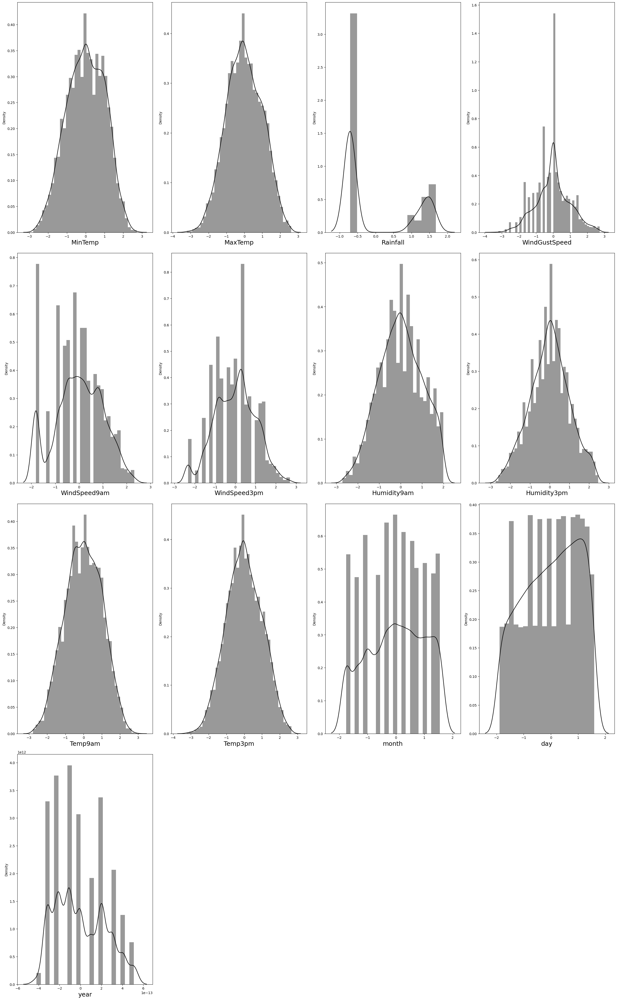

In [226]:
#checking distribution of data after attempting to remove skeweness
plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in numerical:
    if plotnumber <=15:
        ax = plt.subplot(5,4,plotnumber)
        sns.distplot(df[column], color = 'black')
        plt.xlabel(column,fontsize=18)
        
    plotnumber +=1
plt.tight_layout()

In [ ]:
#Dealing with multicollinearity.It be must removed but before that we need to seperate features and labels
#As per problem statement,I will  deal with the classification problem first.(RainTomorrow)

In [227]:
#seperate the target and independent variables into x and y
x=df.drop("RainTomorrow",axis=1)
y=df["RainTomorrow"]
print("Feature Dimension=",x.shape)
print("Label Dimension=",y.shape)

Feature Dimension= (6593, 18)
Label Dimension= (6593,)


In [228]:
#Feature scaling and using standard scalarization to remove biasness
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Temp9am,Temp3pm,RainToday,month,day,year
0,-1.387805,0.068861,-0.122727,1.242573,1.212270,0.556891,1.203377,1.362128,0.898941,0.777183,0.152774,-1.625717,-0.164408,-0.077380,-0.560007,1.547298,-1.891308,-1.773977
1,-1.387805,-1.018325,0.240632,-0.712471,1.427794,0.556891,-0.350759,1.582590,-0.867917,0.580849,-1.384027,-1.437395,-0.111642,0.342668,-0.560007,1.547298,-1.708442,-1.773977
2,-1.387805,-0.021181,0.336932,-0.712471,1.643318,0.704603,1.203377,1.582590,0.816116,0.968815,-1.695672,-1.132896,0.557630,0.160663,-0.560007,1.547298,-1.541647,-1.773977
3,-1.387805,-0.690463,0.696016,-0.712471,-0.727447,-1.174750,0.315299,-1.724337,0.058791,-0.863919,-1.330895,-2.018381,0.046721,0.694612,-0.560007,1.547298,-1.385867,-1.773977
4,-1.387805,0.804258,1.329551,1.317521,1.212270,0.328522,-1.460856,-0.181104,-0.420242,0.379272,0.831513,-0.955008,-0.006077,1.181108,-0.560007,1.547298,-1.238338,-1.773977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6588,1.194148,-1.866342,-0.038664,-0.712471,-1.589543,-0.504111,0.315299,-1.503875,0.267575,-0.615190,-1.005431,-1.499657,-1.356964,0.025552,-0.560007,-0.068382,0.634260,2.143122
6589,1.194148,-1.717462,0.272859,-0.712471,-0.296399,-1.384577,0.315299,-1.062952,0.267575,-0.863919,-0.725961,-1.689569,-1.217061,0.375311,-0.560007,-0.068382,0.735069,2.143122
6590,1.194148,-1.384887,0.526207,-0.712471,-0.942971,0.009883,0.315299,1.362128,-0.168499,-0.863919,-0.894510,-1.499657,-0.936903,0.631753,-0.560007,-0.068382,0.834700,2.143122
6591,1.194148,-0.945315,0.541787,-0.712471,0.350174,-0.780717,0.537319,-1.062952,0.267575,-1.128294,-1.005431,-1.499657,-0.480760,0.615962,-0.560007,-0.068382,0.933217,2.143122


In [229]:
#Checking Variance inflation factor in each scaled column that is x.shape[1](1/(1-R2))
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,1.636491,Location
1,8.020426,MinTemp
2,26.399869,MaxTemp
3,3.197660,Rainfall
4,1.552019,WindGustDir
5,2.010155,WindGustSpeed
6,1.257201,WindDir9am
7,1.423387,WindDir3pm
8,1.976195,WindSpeed9am
9,1.903787,WindSpeed3pm


In [230]:
#Droping Temp3am because it has the highest VIF
x = x.drop(["Temp3pm"],axis=1)

In [231]:
#Checking Variance inflation factor in each scaled column that is x.shape[1](1/(1-R2)) again
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,1.635059,Location
1,7.998849,MinTemp
2,9.505314,MaxTemp
3,3.196396,Rainfall
4,1.544697,WindGustDir
5,1.982150,WindGustSpeed
6,1.256840,WindDir9am
7,1.419908,WindDir3pm
8,1.976036,WindSpeed9am
9,1.902541,WindSpeed3pm


In [232]:
#Droping Pressure9am because it has the highest VIF
x = x.drop(["Temp9am"],axis=1)

In [233]:
#Checking Variance inflation factor in each scaled column that is x.shape[1](1/(1-R2)) again
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,1.634528,Location
1,4.492978,MinTemp
2,5.201904,MaxTemp
3,3.195831,Rainfall
4,1.543897,WindGustDir
5,1.953579,WindGustSpeed
6,1.256770,WindDir9am
7,1.419889,WindDir3pm
8,1.961851,WindSpeed9am
9,1.853640,WindSpeed3pm


In [ ]:
Multicollinearity has been eliminated,we can proceed with model building

In [234]:
#checking the target variable
y.value_counts()

RainTomorrow
0    5041
1    1552
Name: count, dtype: int64

In [ ]:
#there is an imbalance in the data.This is a classification problem so we need to balance the data using an oversampling method

In [235]:
#Oversampling the data
!pip install imblearn
from imblearn.over_sampling import SMOTE
SM=SMOTE()
x1,y1=SM.fit_resample(x, y)

Defaulting to user installation because normal site-packages is not writeable


In [236]:
#Modelling

#Finding the best random state

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRS = 0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    RFR=RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu,"at random_state",maxRS)

Best accuracy is  0.8660262891809909 at random_state 148


In [237]:
#defining train and test split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxRS)

In [238]:
#Import classification algorithms

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
from sklearn.model_selection import cross_val_score

In [239]:
#checking accuracy for Random Forest Classifier

RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC=RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.8584428715874621
[[1470   69]
 [ 211  228]]
              precision    recall  f1-score   support

           0       0.87      0.96      0.91      1539
           1       0.77      0.52      0.62       439

    accuracy                           0.86      1978
   macro avg       0.82      0.74      0.77      1978
weighted avg       0.85      0.86      0.85      1978



In [240]:
#checking testing accuracy for KNeighbors
KNN=KNeighborsClassifier()
KNN.fit(x_train,y_train)
predKNN=KNN.predict(x_test)
print(accuracy_score(y_test,predKNN))
print(confusion_matrix(y_test,predKNN))
print(classification_report(y_test,predKNN))

0.8195146612740142
[[1441   98]
 [ 259  180]]
              precision    recall  f1-score   support

           0       0.85      0.94      0.89      1539
           1       0.65      0.41      0.50       439

    accuracy                           0.82      1978
   macro avg       0.75      0.67      0.70      1978
weighted avg       0.80      0.82      0.80      1978



In [241]:
#checking accuracy of Logistic Regression

LR=LogisticRegression()
LR.fit(x_train,y_train)
predLR=LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.8584428715874621
[[1462   77]
 [ 203  236]]
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      1539
           1       0.75      0.54      0.63       439

    accuracy                           0.86      1978
   macro avg       0.82      0.74      0.77      1978
weighted avg       0.85      0.86      0.85      1978



In [242]:
#checking accuracy for Support Vector Machine Classifier
SVC=SVC()
SVC.fit(x_train,y_train)
predSVC=SVC.predict(x_test)
print(accuracy_score(y_test,predSVC))
print(confusion_matrix(y_test,predSVC))
print(classification_report(y_test,predSVC))

0.8599595551061678
[[1483   56]
 [ 221  218]]
              precision    recall  f1-score   support

           0       0.87      0.96      0.91      1539
           1       0.80      0.50      0.61       439

    accuracy                           0.86      1978
   macro avg       0.83      0.73      0.76      1978
weighted avg       0.85      0.86      0.85      1978



In [243]:
#checking accuracy for Gradient Boosting Classifier
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB=GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.865520728008089
[[1471   68]
 [ 198  241]]
              precision    recall  f1-score   support

           0       0.88      0.96      0.92      1539
           1       0.78      0.55      0.64       439

    accuracy                           0.87      1978
   macro avg       0.83      0.75      0.78      1978
weighted avg       0.86      0.87      0.86      1978



In [244]:
#checking accuracy for AdaBoost Classifier
ABC=AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC=ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.8498483316481295
[[1462   77]
 [ 220  219]]
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      1539
           1       0.74      0.50      0.60       439

    accuracy                           0.85      1978
   macro avg       0.80      0.72      0.75      1978
weighted avg       0.84      0.85      0.84      1978



In [245]:
#checking accuracy for Bagging Classifier
BC=BaggingClassifier()
BC.fit(x_train,y_train)
predBC=BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.8473205257836198
[[1463   76]
 [ 226  213]]
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      1539
           1       0.74      0.49      0.59       439

    accuracy                           0.85      1978
   macro avg       0.80      0.72      0.75      1978
weighted avg       0.84      0.85      0.84      1978



In [246]:
#checking accuracy for ExtraTreesClassifier
ET=ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET=ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.8634984833164813
[[1487   52]
 [ 218  221]]
              precision    recall  f1-score   support

           0       0.87      0.97      0.92      1539
           1       0.81      0.50      0.62       439

    accuracy                           0.86      1978
   macro avg       0.84      0.73      0.77      1978
weighted avg       0.86      0.86      0.85      1978



In [247]:
#Cross validation Score
from sklearn.model_selection import cross_val_score

In [248]:
#Checking CV score for Random Forest Classifier
score=cross_val_score(RFC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predRFC)-score.mean())

[0.85064443 0.80212282 0.77558757 0.73216995 0.85204856]
0.8025146654303107
Difference between Accuracy score and cross validation score is - 0.05592820615715144


In [249]:
#Checking CV score for KNeighbours Classifier
score=cross_val_score(KNN,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predKNN)-score.mean())

[0.81880212 0.74677786 0.76194086 0.78224583 0.80576631]
0.7831065977467182
Difference between Accuracy score and cross validation score is - 0.036408063527295975


In [251]:
#Checking CV score for Logistic Regression
score=cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predLR)-score.mean())

[0.85291888 0.76648976 0.77558757 0.83080425 0.85356601]
0.8158732934432095
Difference between Accuracy score and cross validation score is - 0.04256957814425266


In [252]:
#Checking CV score for Support Vector Machine Classifier
score=cross_val_score(SVC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predSVC)-score.mean())

[0.85443518 0.78241092 0.78316907 0.78983308 0.84218513]
0.8104066744820937
Difference between Accuracy score and cross validation score is - 0.04955288062407415


In [253]:
#Checking CV score for Gradient Boosting Classifier
score=cross_val_score(GB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predGB)-score.mean())

[0.85595148 0.77937832 0.74450341 0.71775417 0.83611533]
0.7867405412432511
Difference between Accuracy score and cross validation score is - 0.07878018676483789


In [254]:
#Checking CV score for AdaBoost Classifier
score=cross_val_score(ABC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predABC)-score.mean())

[0.84306293 0.79226687 0.76648976 0.71168437 0.82018209]
0.7867372049225685
Difference between Accuracy score and cross validation score is - 0.06311112672556096


In [255]:
#Checking CV score for Bagging Classifier
score=cross_val_score(BC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predBC)-score.mean())

[0.81804397 0.80439727 0.76421531 0.715478   0.81942337]
0.7843115847408196
Difference between Accuracy score and cross validation score is - 0.06300894104280019


In [256]:
#Checking CV score for ExtraTreesClassifier
score=cross_val_score(ET,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predET)-score.mean())

[0.84609553 0.79984837 0.77862017 0.79666161 0.83080425]
0.8104059842088491
Difference between Accuracy score and cross validation score is - 0.05309249910763214


In [ ]:
I selected RandomForestClassifier as the best model because it has almost the same diffrence between Accuracy and 
cross validation score as other models

In [260]:
#Hyper parameter tuning

from sklearn.model_selection import RandomizedSearchCV
parameters={'criterion' : ['gini', 'entropy'], 
              'min_samples_leaf' : [1, 5, 10,],
              'min_samples_split' : [2, 4, 8], 
              'n_estimators': [10, 20, 25],
              'max_features':['sqrt','log2', None]}

random_cv=RandomizedSearchCV(RandomForestClassifier(),parameters,cv=5)
model=RandomForestClassifier()
random_cv=RandomizedSearchCV(estimator=model,
                             param_distributions=parameters,
                             cv=5,
                             n_iter=10,
                             scoring='accuracy',
                             verbose=5,
                             return_train_score=True)
random_cv.fit(x_train,y_train)

Final_model=RandomForestClassifier()
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=gini, max_features=None, min_samples_leaf=5, min_samples_split=4, n_estimators=10;, score=(train=0.921, test=0.828) total time=   0.2s
[CV 2/5] END criterion=gini, max_features=None, min_samples_leaf=5, min_samples_split=4, n_estimators=10;, score=(train=0.917, test=0.841) total time=   0.2s
[CV 3/5] END criterion=gini, max_features=None, min_samples_leaf=5, min_samples_split=4, n_estimators=10;, score=(train=0.921, test=0.822) total time=   0.2s
[CV 4/5] END criterion=gini, max_features=None, min_samples_leaf=5, min_samples_split=4, n_estimators=10;, score=(train=0.922, test=0.821) total time=   0.3s
[CV 5/5] END criterion=gini, max_features=None, min_samples_leaf=5, min_samples_split=4, n_estimators=10;, score=(train=0.919, test=0.824) total time=   0.3s
[CV 1/5] END criterion=entropy, max_features=None, min_samples_leaf=5, min_samples_split=4, n_estimators=25;, score=(train=0.939, test=0.830) total t

In [ ]:
The accuracy score incresed after parameter tuning so we proceed

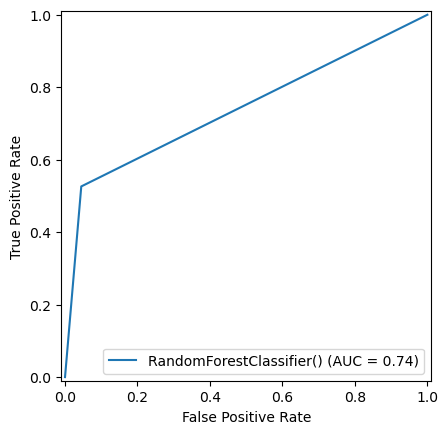

In [261]:
#Plotting ROC and compare AUC for  the model used
from sklearn import metrics
fpr,tpr,thresholds=metrics.roc_curve(y_test,pred)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=Final_model)
display.plot()

In [ ]:
The model has an AUC = 74% and 85.99 % accuracy

In [262]:
#Saving the model
import joblib
joblib.dump(Final_model,"Rainfall_Weather_Forecasting_RainTomorrow.pkl")

['Rainfall_Weather_Forecasting_RainTomorrow.pkl']

In [263]:
#Loading the saved model to get predictions
model=joblib.load("Rainfall_Weather_Forecasting_RainTomorrow.pkl")

In [264]:
#Prediction
prediction=model.predict(x_test)
prediction

array([0, 1, 0, ..., 0, 0, 0])

In [265]:
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=prediction
df["Original"]=a
df
#the predictions for Income

,Predicted,Original
0,0,0
1,1,1
2,0,0
3,0,0
4,1,1
...,...,...
1973,0,0
1974,0,0
1975,0,0
1976,0,0


In [266]:
#Second part of the solution is a Regression Model as prescribed

In [269]:
#fetching my clean data frame saved earlier
df

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,month,day,year
0,1,13.4,22.9,0.6,13,44.0,13,14,20.0,24.0,71.0,22.0,16.9,21.8,0,0,12,1,2008
1,1,7.4,25.1,0.0,14,44.0,6,15,4.0,22.0,44.0,25.0,17.2,24.3,0,0,12,2,2008
2,1,12.9,25.7,0.0,15,46.0,13,15,19.0,26.0,38.0,30.0,21.0,23.2,0,0,12,3,2008
3,1,9.2,28.0,0.0,4,24.0,9,0,11.0,9.0,45.0,16.0,18.1,26.5,0,0,12,4,2008
4,1,17.5,32.3,1.0,13,41.0,1,7,7.0,20.0,82.0,33.0,17.8,29.7,0,0,12,5,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.4,0.0,0,31.0,9,1,13.0,11.0,51.0,24.0,10.1,22.4,0,0,6,21,2017
8421,9,3.6,25.3,0.0,6,22.0,9,3,13.0,9.0,56.0,21.0,10.9,24.5,0,0,6,22,2017
8422,9,5.4,26.9,0.0,3,37.0,9,14,9.0,9.0,53.0,24.0,12.5,26.1,0,0,6,23,2017
8423,9,7.8,27.0,0.0,9,28.0,10,3,13.0,7.0,51.0,24.0,15.1,26.0,0,0,6,24,2017


In [270]:
#check VIF
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif["Features"]=x.columns
vif
#there is no multicollinearity

,VIF values,Features
0,1.634528,Location
1,4.492978,MinTemp
2,5.201904,MaxTemp
3,3.195831,Rainfall
4,1.543897,WindGustDir
5,1.953579,WindGustSpeed
6,1.256770,WindDir9am
7,1.419889,WindDir3pm
8,1.961851,WindSpeed9am
9,1.853640,WindSpeed3pm


In [271]:
#seperate the target and independent variables into x and y
x=df.drop("Rainfall",axis=1)
y=df["Rainfall"]
print("Feature Dimension=",x.shape)
print("Label Dimension=",y.shape)

Feature Dimension= (6593, 18)
Label Dimension= (6593,)


In [272]:
#Feature scaling and using standard scalarization to remove biasness
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Location,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,month,day,year
0,-1.387805,0.063177,-0.184825,1.212270,0.491849,1.203377,1.362128,0.859051,0.752933,0.185396,-1.564893,-0.162319,-0.142519,-0.560007,-0.554865,1.647549,-1.675303,-1.767875
1,-1.387805,-1.020586,0.180289,1.427794,0.491849,-0.350759,1.582590,-0.914534,0.532640,-1.404934,-1.401133,-0.109561,0.283508,-0.560007,-0.554865,1.647549,-1.561541,-1.767875
2,-1.387805,-0.027137,0.279865,1.643318,0.654096,1.203377,1.582590,0.748202,0.973226,-1.758340,-1.128201,0.558699,0.096056,-0.560007,-0.554865,1.647549,-1.447779,-1.767875
3,-1.387805,-0.695457,0.661575,-0.727447,-1.130626,0.315299,-1.724337,-0.138591,-0.899266,-1.346033,-1.892412,0.048711,0.658413,-0.560007,-0.554865,1.647549,-1.334017,-1.767875
4,-1.387805,0.803749,1.375205,1.212270,0.248478,-1.460856,-0.181104,-0.581987,0.312346,0.833308,-0.964441,-0.004046,1.203728,-0.560007,-0.554865,1.647549,-1.220255,-1.767875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6588,1.194148,-1.851472,-0.101844,-1.589543,-0.562760,0.315299,-1.503875,0.083107,-0.678973,-0.992626,-1.455720,-1.358152,-0.040273,-0.560007,-0.554865,-0.135542,0.599938,2.149388
6589,1.194148,-1.706970,0.213481,-0.296399,-1.292873,0.315299,-1.062952,0.083107,-0.899266,-0.698121,-1.619479,-1.217466,0.317591,-0.560007,-0.554865,-0.135542,0.713700,2.149388
6590,1.194148,-1.381841,0.479018,-0.942971,-0.076017,0.315299,1.362128,-0.360289,-0.899266,-0.874824,-1.455720,-0.936093,0.590248,-0.560007,-0.554865,-0.135542,0.827462,2.149388
6591,1.194148,-0.948335,0.495614,0.350174,-0.806131,0.537319,-1.062952,0.083107,-1.119559,-0.992626,-1.455720,-0.478863,0.573207,-0.560007,-0.554865,-0.135542,0.941224,2.149388


In [273]:
#Modelling
#import the necessary libraries

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score

In [274]:
#Creating train test split
#Finding the best random state

maxAccu = 0
maxRS = 0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=i)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    pred=LR.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"at random_state",maxRS)

Maximum r2 score is  0.3628049641447767 at random_state 160


In [275]:
#Import Regression algorithms

from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor

In [276]:
#checking accuracy of Linear Regression

LR=LinearRegression()
LR.fit(x_train,y_train)
pred_LR=LR.predict(x_test)
pred_train=LR.predict(x_train)
print('R2_score:',r2_score(y_test,pred_LR))
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_LR))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_LR))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred_LR)))

R2_score: 0.17235904486283427
R2_score on training data: 27.049524796279012
Mean Absolute Error:- 3.208731981710631
Mean Squared Error:- 137.9486093218418
Root Mean Squared Error:- 11.7451525882741


In [277]:
#checking accuracy of RandomForestRegressor

RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR=RFR.predict(x_test)
pred_train=RFR.predict(x_train)
print('R2_score:',r2_score(y_test,pred_RFR))
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_RFR))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_RFR))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred_RFR)))

R2_score: 0.1586113102490888
R2_score on training data: 89.50779969939823
Mean Absolute Error:- 2.777035779260158
Mean Squared Error:- 140.24003878714373
Root Mean Squared Error:- 11.842298712122732


In [278]:
#checking accuracy of KNN Model

knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2_score:',r2_score(y_test,pred_knn))
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_knn))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred_knn)))

R2_score: 0.15767288172089655
R2_score on training data: 46.2580873378455
Mean Absolute Error:- 2.7809581564584596
Mean Squared Error:- 140.39645312310492
Root Mean Squared Error:- 11.848900924689383


In [279]:
#checking accuracy of the Gradient Boosting Regressor

GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_GBR=GBR.predict(x_test)
pred_train=GBR.predict(x_train)
print('R2_score:',r2_score(y_test,pred_GBR))
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_GBR))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_GBR))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred_GBR)))

R2_score: 0.19562802375186328
R2_score on training data: 56.82602689651412
Mean Absolute Error:- 2.788830176788322
Mean Squared Error:- 134.07020859969668
Root Mean Squared Error:- 11.578869055296233


In [280]:
#checking accuracy of the Lasso Regressor

lasso=Lasso()
lasso.fit(x_train,y_train)
pred_lasso=lasso.predict(x_test)
pred_train=lasso.predict(x_train)
print('R2_score:',r2_score(y_test,pred_lasso))
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_lasso))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_lasso))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred_lasso)))

R2_score: 0.14616074427481474
R2_score on training data: 24.163420270404433
Mean Absolute Error:- 2.852744469306491
Mean Squared Error:- 142.31526023523688
Root Mean Squared Error:- 11.929595979547543


In [281]:
#checking accuracy of the Ridge Regressor

rd=Ridge()
rd.fit(x_train,y_train)
pred_rd=rd.predict(x_test)
pred_train=rd.predict(x_train)
print('R2_score:',r2_score(y_test,pred_rd))
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_rd))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_rd))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred_rd)))

R2_score: 0.17235681957680749
R2_score on training data: 27.049503565801835
Mean Absolute Error:- 3.207859256546157
Mean Squared Error:- 137.9489802255662
Root Mean Squared Error:- 11.745168377914649


In [282]:
#checking accuracy of the Decision Tree Regressor

dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
pred_dtr=dtr.predict(x_test)
pred_train=dtr.predict(x_train)
print('R2_score:',r2_score(y_test,pred_dtr))
print('R2_score on training data:',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_dtr))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_dtr))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred_dtr)))

R2_score: -0.4839882427612825
R2_score on training data: 100.0
Mean Absolute Error:- 3.524439053972104
Mean Squared Error:- 247.34652516676778
Root Mean Squared Error:- 15.727254215748145


In [283]:
#Cross validation Score-to compare and select an appropriate model for the predictive modelling problem.It prevents overfitting
from sklearn.model_selection import cross_val_score

In [284]:
#Checking CV score for Linear Regressor
score=cross_val_score(LR,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is -",(r2_score(y_test,pred_LR)-score.mean())*100)

[0.16085478 0.20646606 0.30942379 0.25179418 0.35613448]
0.2569346585778046
Difference between R2 score and cross validation score is - -8.457561371497036


In [285]:
#Checking CV score for Random Forest Regressor
score=cross_val_score(RFR,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is -",(r2_score(y_test,pred_RFR)-score.mean())*100)

[0.18930436 0.17283153 0.21878272 0.01133665 0.39064082]
0.19657921565623626
Difference between R2 score and cross validation score is - -3.796790540714745


In [286]:
#Checking CV score for KNN model
score=cross_val_score(knn,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is -",(r2_score(y_test,pred_knn)-score.mean())*100)

[ 0.20524567 -0.10593565  0.24814726 -0.04834423  0.23520447]
0.10686350422278887
Difference between R2 score and cross validation score is - 5.080937749810769


In [287]:
#Checking CV score for Gradient Boosting Regressor model
score=cross_val_score(GBR,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is -",(r2_score(y_test,pred_GBR)-score.mean())*100)

[0.19726683 0.19882267 0.15741348 0.19536651 0.30127906]
0.21002970880629804
Difference between R2 score and cross validation score is - -1.4401685054434759


In [288]:
#Checking CV score for Lasso Regressor model
score=cross_val_score(lasso,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is -",(r2_score(y_test,pred_lasso)-score.mean())*100)

[0.13120774 0.18891888 0.29189521 0.25456687 0.3321232 ]
0.23974237964960907
Difference between R2 score and cross validation score is - -9.358163537479433


In [289]:
#Checking CV score for Ridge Regressor model
score=cross_val_score(rd,x,y)
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is -",r2_score(y_test,pred_rd)-score.mean())

[0.16083923 0.20650302 0.30944544 0.25180488 0.35614903]
0.2569483198936793
Difference between R2 score and cross validation score is - -0.08459150031687179


In [290]:
#Checking CV score for Decision tree regressor model
score=cross_val_score(dtr,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is -",(r2_score(y_test,pred_dtr)-score.mean())*100)

[-0.13897962 -0.10827402 -0.43682536 -1.95122627 -0.26592341]
-0.5802457347523345
Difference between R2 score and cross validation score is - 9.625749199105204


In [ ]:
#Model Selection
#DecisionTreeRegressor model is the best because it has the least difference between R2 score and cross validation score -12.77

In [295]:
#Hyper parameter tuning

from sklearn.model_selection import RandomizedSearchCV
parameters={'criterion' : ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
              'splitter' : ['best', 'random'],
              'max_depth' : [2,3,1.0,2.0,None], 
              'max_features': [10,20,25,50,15,'sqrt','log2',None],
              'min_samples_split':[1.0,0.5,3.0,2.5]}

random_cv=RandomizedSearchCV(DecisionTreeRegressor(),parameters,cv=5)
model=DecisionTreeRegressor()
random_cv=RandomizedSearchCV(estimator=model,
                             param_distributions=parameters,
                             cv=5,
                             n_iter=10,
                             scoring='accuracy',
                             verbose=5,
                             return_train_score=True)

random_cv.fit(x_train,y_train)

Final_model=DecisionTreeRegressor()
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
print('R2_score:',r2_score(y_test,pred))
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred))
print('Mean Squared Error:-',mean_squared_error(y_test,pred))
print("Root Mean Squared Error:-",np.sqrt(mean_squared_error(y_test,pred)))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=squared_error, max_depth=2, max_features=sqrt, min_samples_split=1.0, splitter=best;, score=(train=nan, test=nan) total time=   0.0s
[CV 2/5] END criterion=squared_error, max_depth=2, max_features=sqrt, min_samples_split=1.0, splitter=best;, score=(train=nan, test=nan) total time=   0.0s
[CV 3/5] END criterion=squared_error, max_depth=2, max_features=sqrt, min_samples_split=1.0, splitter=best;, score=(train=nan, test=nan) total time=   0.0s
[CV 4/5] END criterion=squared_error, max_depth=2, max_features=sqrt, min_samples_split=1.0, splitter=best;, score=(train=nan, test=nan) total time=   0.0s
[CV 5/5] END criterion=squared_error, max_depth=2, max_features=sqrt, min_samples_split=1.0, splitter=best;, score=(train=nan, test=nan) total time=   0.0s
[CV 1/5] END criterion=poisson, max_depth=1.0, max_features=20, min_samples_split=1.0, splitter=best;, score=(train=nan, test=nan) total time=   0.0s
[CV 2/5] 

In [296]:
#Saving the model
import joblib
joblib.dump(Final_model,"Rainfall_Weather_Forecasting_Rainfall.pkl")

['Rainfall_Weather_Forecasting_Rainfall.pkl']

In [297]:
#loading the saved model to get predictions
model=joblib.load("Rainfall_Weather_Forecasting_Rainfall.pkl")

In [298]:
#Prediction
prediction=model.predict(x_test)
prediction

array([0. , 0.2, 0. , ..., 0.2, 2.2, 0.6])

In [299]:
#the predictions for Attrition
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=prediction
df["Original"]=a
df

,Predicted,Original
0,0.0,0.0
1,0.2,0.4
2,0.0,0.0
3,0.6,0.0
4,2.8,12.0
...,...,...
1644,0.0,0.0
1645,0.0,0.0
1646,0.2,0.0
1647,2.2,1.4
